# <font style = "color:rgb(50,120,229)"> Coin Detection </font>

So far we have studied about various mophological operations and different thresholding techniques in some detail. Now it's time to apply these concepts for a practical application - **Coin Detection**.

## <font style = "color:rgb(50,120,229)"> Aim </font>

In this assignment, you will work with 2 different images (so 2 different parts) and will use **only** morphological operations and thresholding techniques to detect the total number of coins present in the image. Your submission will be graded based on your use of the concepts covered in this module, experimentation performed to achieve at your final solution, documentation, and finally, the total number of coins successfully detected in the images. Each part will be of 15 marks. This assignment will be entirely **manually graded** so make sure that you do NOT remove any experimentation you have done as well as the observation you made after each step.

**Proper documentation for each step should be provided with help of markdown**

## <font style = "color:rgb(50,120,229)">Outline</font>

The main steps that you can follow to solve this assignment are:

1. Read the image.
2. Convert it to grayscale and split the image into the 3 (Red, Green and Blue) channels. Decide which of the above 4 images you want to use in further steps and provide reason for the same.
3. Use thresholding and/or morphological operations to arrive at a final binary image.
4. Use **simple blob detector** to count the number of coins present in the image.
5. Use **contour detection** to count the number of coins present in the image.
6. Use **CCA** to count the number of coins present in the image.

**We have also provided the results we obtained at the intermediate steps for your reference.**

# <font style = "color:rgb(50,120,229)">Assignment Part - A</font>

## <font style = "color:rgb(50,120,229)"> Step 1: Read Image</font>

In [1]:
import cv2
import matplotlib.pyplot as plt
from dataPath import DATA_PATH
import numpy as np
%matplotlib inline

ModuleNotFoundError: No module named 'dataPath'

In [ ]:
import matplotlib
matplotlib.rcParams['figure.figsize'] = (10.0, 10.0)
matplotlib.rcParams['image.cmap'] = 'gray'

Text(0.5,1,'Original Image')

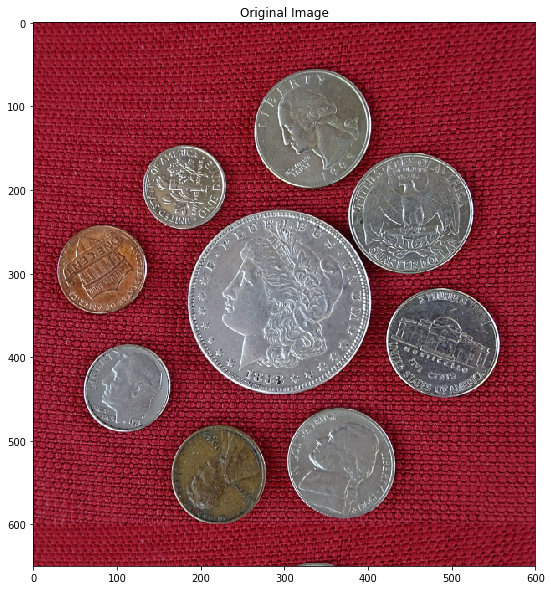

In [4]:
# Image path
imagePath = DATA_PATH + "images/CoinsA.png"
# Read image
# Store it in the variable image
image = cv2.imread(imagePath)
imageCopy = image.copy()
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")

## <font style = "color:rgb(50,120,229)">Step 2.1: Convert Image to Grayscale</font>

In [4]:
# Convert image to grayscale
# Store it in the variable imageGray
imageGray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

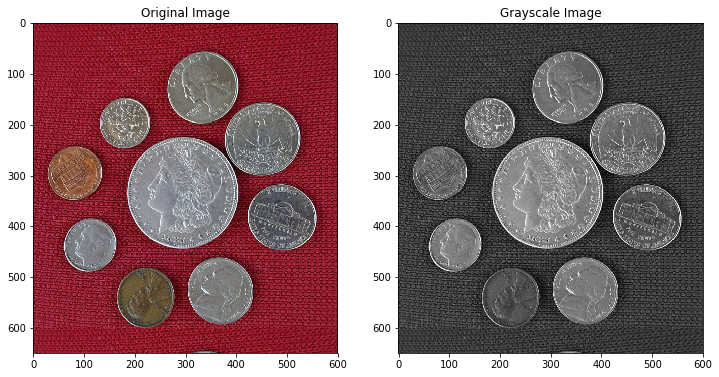

In [5]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(122)
plt.imshow(imageGray);
plt.title("Grayscale Image");

## <font style = "color:rgb(50,120,229)">Step 2.2: Split Image into R,G,B Channels</font>

In [6]:
# Split cell into channels
# Store them in variables imageB, imageG, imageR
imageB = image[:,:,0]
imageG = image[:,:,1]
imageR = image[:,:,2]

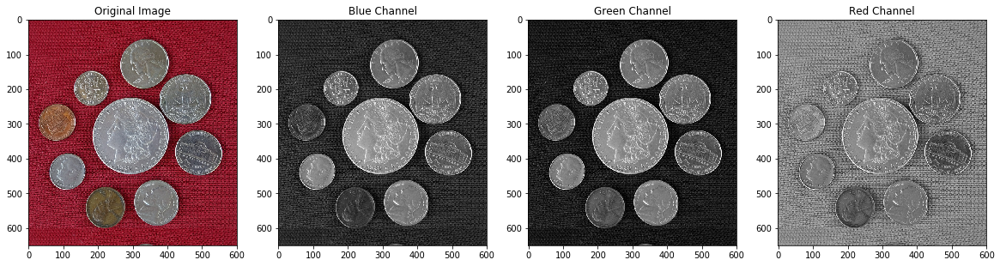

In [7]:
plt.figure(figsize=(20,12))
plt.subplot(141)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(142)
plt.imshow(imageB);
plt.title("Blue Channel")
plt.subplot(143)
plt.imshow(imageG);
plt.title("Green Channel")
plt.subplot(144)
plt.imshow(imageR);
plt.title("Red Channel");

## <font style = "color:rgb(50,120,229)">Step 3.1: Perform Thresholding</font>

You will have to carry out this step with different threshold values to see which one suits you the most. Do not remove those intermediate images and make sure to document your findings.

In [9]:
# The first step begins with the thresholding for blob detection. For blob Detection the background should be black 
# and foreground should be white OR White background and Black foreground
# As asked above to choose one of the 4 images to proceed with thresholding, morphological operations and Blob Detection
# I will be first thresholding all the 4 images to check which one gives more accurate results and based on the further
# process will be followed
'''
For thresholding I am applying THRESH_BINARY_INV and THRESH_BINARY methods as they are most basic and easy to understand.
THRESH_BINARY_INV pixelvalue>threshvalue then set that pixel value = 0 pixelvalue<255 then set that pixel value to 255 
THRESH_BINARY pixelvalue>threshvalue then set that pixel value to 255 and pixelvalue<255 then set that pixel value to 0

Below you will see for thresholding I am trying out some random values. Only those values will be taken into consideration 
which gives close to convincing or convinving results 
'''

'\nFor thresholding I am applying THRESH_BINARY_INV and THRESH_BINARY methods as they are most basic and easy to understand.\nTHRESH_BINARY_INV pixelvalue>threshvalue then set that pixel value = 0 pixelvalue<255 then set that pixel value to 255 \nTHRESH_BINARY pixelvalue>threshvalue then set that pixel value to 255 and pixelvalue<255 then set that pixel value to 0\n\nBelow you will see for thresholding I am trying out some random values. Only those values will be taken into consideration \nwhich gives close to convincing or convinving results \n'

### Thresholding on Image with GrayScale

In [3]:
_,threshimagegray_inv = cv2.threshold(imageGray,35,255,cv2.THRESH_BINARY_INV)
_,threshimagegray_binary = cv2.threshold(imageGray,35,255,cv2.THRESH_BINARY)
plt.figure(figsize=(15,15));
plt.subplot(121);plt.title("THRESH_BINARY imageGray");plt.imshow(threshimagegray_binary);
plt.subplot(122);plt.title("THRESH_BINARY_INV imageGray");plt.imshow(threshimagegray_inv);


# Please refer to the previous mail where I mentioned different dst values which will be applied in the following way:
'''
maxVal = 255

_, tImg_0 = cv2.threshold(imageG, 100, maxVal, cv2.THRESH_BINARY_INV)
_, tImg_1 = cv2.threshold(imageG, 75, maxVal, cv2.THRESH_BINARY_INV)
_, tImg_2 = cv2.threshold(imageG, 50, maxVal, cv2.THRESH_BINARY_INV)
_, tImg_3 = cv2.threshold(imageG, 25, maxVal, cv2.THRESH_BINARY_INV)
_, tImg_4 = cv2.threshold(imageG, 15, maxVal, cv2.THRESH_BINARY_INV)

Checkout these results and compare with your implementation.
It's better if you imageG, imageB or imageR instead of imageGray'''

NameError: name 'cv2' is not defined

### Thresholding on Image with Red Channel

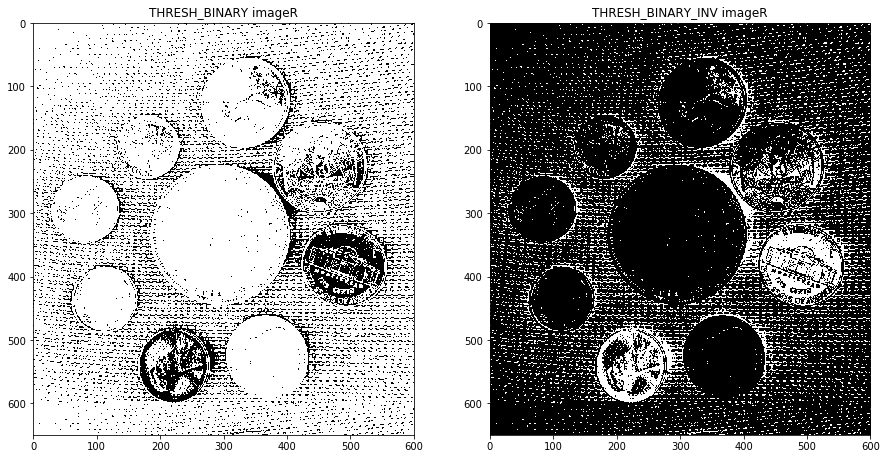

In [9]:
# Refer to the previous cell as only that is required
_,threshimagered = cv2.threshold(imageR,100,255,cv2.THRESH_BINARY)
_,threshimagered_inv = cv2.threshold(imageR,100,255,cv2.THRESH_BINARY_INV)
plt.figure(figsize=(15,15));
plt.subplot(121);plt.title("THRESH_BINARY imageR");plt.imshow(threshimagered);
plt.subplot(122);plt.title("THRESH_BINARY_INV imageR");plt.imshow(threshimagered_inv);

### Thresholding on Image with Blue Channel

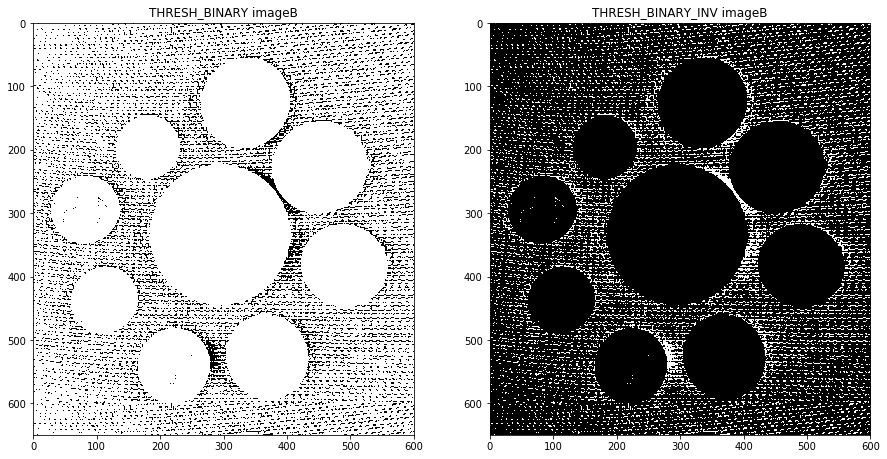

In [10]:
# Refer to previous cell
_,threshimageblue = cv2.threshold(imageB,21,255,cv2.THRESH_BINARY)
_,threshimageblue_inv = cv2.threshold(imageB,21,255,cv2.THRESH_BINARY_INV)
plt.figure(figsize=(15,15));
plt.subplot(121);plt.title("THRESH_BINARY imageB");plt.imshow(threshimageblue);
plt.subplot(122);plt.title("THRESH_BINARY_INV imageB");plt.imshow(threshimageblue_inv);

### Thresholding on Image with Green Channel

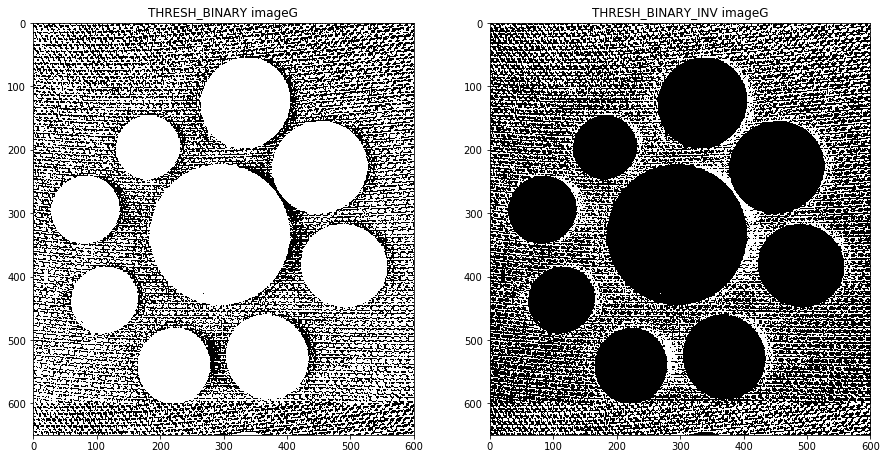

In [11]:
# Refer to previous cell
_,threshimagegreen_inv = cv2.threshold(imageG,21,255,cv2.THRESH_BINARY_INV)
_,threshimagegreen_binary = cv2.threshold(imageG,21,255,cv2.THRESH_BINARY)
plt.figure(figsize=(15,15));
plt.subplot(121);plt.title("THRESH_BINARY imageG");plt.imshow(threshimagegreen_binary);
plt.subplot(122);plt.title("THRESH_BINARY_INV imageG");plt.imshow(threshimagegreen_inv);

In [14]:
'''
Based upon above experiments we can see that only imageG, imageB and imageGray qualifies for further 
experimentaion as they have good highlited detectable foreground to perform experiments
Let's do not waste time and move further along with our experiments 
we don't know how our experiments will unfold our findings?
'''

"\nBased upon above experiments we can see that only imageG, imageB and imageGray qualifies for further \nexperimentaion as they have good highlited detectable foreground to perform experiments\nLet's do not waste time and move further along with our experiments \nwe don't know how our experiments will unfold our findings?\n"

## <font style = "color:rgb(50,120,229)">Step 3.2: Perform morphological operations</font>

You will have to carry out this step with different kernel size, kernel shape and morphological operations to see which one (or more) suits you the most. Do not remove those intermediate images and make sure to document your findings.

In [15]:
help(cv2)

Help on module cv2:

NAME
    cv2 - Python wrapper for OpenCV.

SUBMODULES
    Error
    aruco
    bgsegm
    bioinspired
    cuda
    datasets
    detail
    dnn
    face
    fisheye
    flann
    freetype
    ft
    hdf
    hfs
    img_hash
    instr
    ipp
    kinfu
    line_descriptor
    linemod
    ml
    motempl
    multicalib
    ocl
    ogl
    omnidir
    optflow
    plot
    ppf_match_3d
    quality
    reg
    rgbd
    saliency
    samples
    sfm
    structured_light
    text
    utils
    videoio_registry
    videostab
    ximgproc
    xphoto

CLASSES
    builtins.Exception(builtins.BaseException)
        error
    builtins.object
        Algorithm
            AlignExposures
                AlignMTB
            BackgroundSubtractor
                BackgroundSubtractorKNN
                BackgroundSubtractorMOG2
                bgsegm_BackgroundSubtractorCNT
                bgsegm_BackgroundSubtractorGMG
                bgsegm_BackgroundSubtractorGSOC
                bgse

### Get the structuring Element/Kernel which will slide through image to perform bitwiseoperations based on erosion and dilation resulting into new modified image

### ImageG Morphological Operations

In [12]:
elementkernel_g = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(8,8))

#### EROSION FOLLOWED BY DILATION on THRESHOLDED image with GREEN Channel and BINARY METHOD

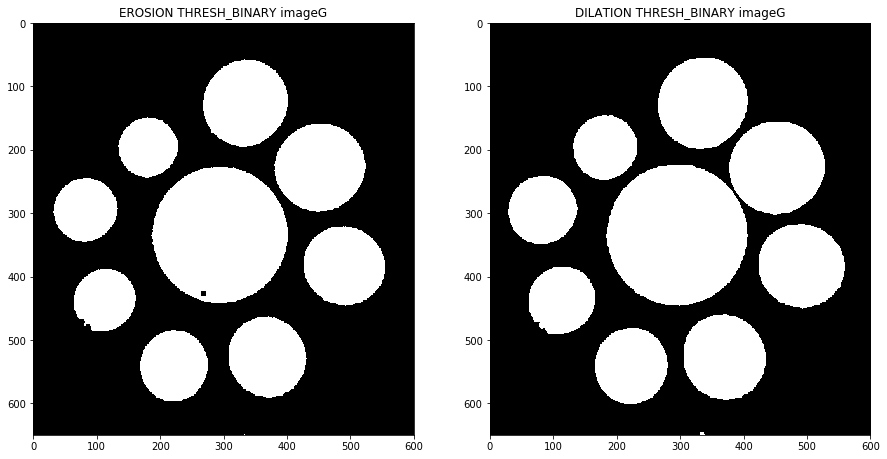

In [13]:
erodeimagegreen_binary=cv2.erode(threshimagegreen_binary,elementkernel_g)
dilateimagegreen_binary=cv2.dilate(erodeimagegreen_binary,elementkernel_g)
plt.figure(figsize=(15,15));
plt.subplot(121);plt.title("EROSION THRESH_BINARY imageG");plt.imshow(erodeimagegreen_binary);
plt.subplot(122);plt.title("DILATION THRESH_BINARY imageG");plt.imshow(dilateimagegreen_binary);

#### DILATION FOLLOWED BY EROSION on THRESHOLDED image with GREEN Channel and BINARY INVERSE METHOD

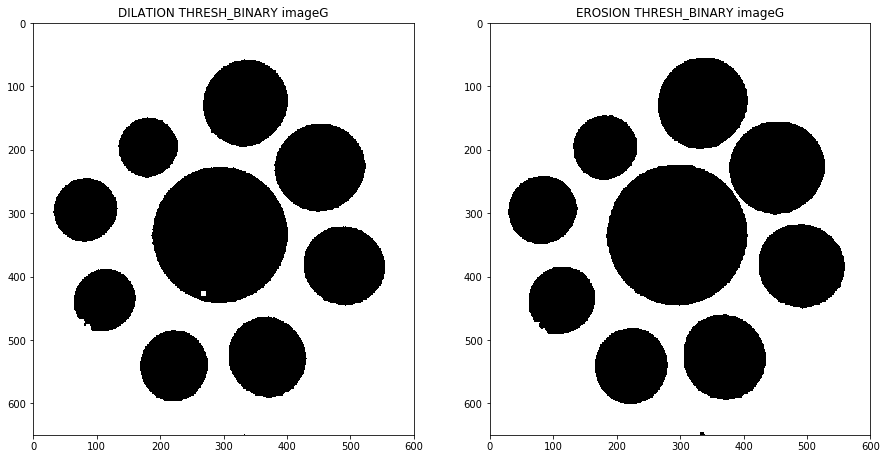

In [15]:
dilateimagegreen_inv=cv2.dilate(threshimagegreen_inv,elementkernel_g)
erodeimagegreen_inv=cv2.erode(dilateimagegreen_inv,elementkernel_g)
plt.figure(figsize=(15,15));
plt.subplot(121);plt.title("DILATION THRESH_BINARY imageG");plt.imshow(dilateimagegreen_inv);
plt.subplot(122);plt.title("EROSION THRESH_BINARY imageG");plt.imshow(erodeimagegreen_inv);

### ImageB Morphological Operations

In [16]:
elementkernel_b = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(4,4))
itre_b = 5

#### EROSION FOLLOWED BY DILATION on THRESHOLDED image with BLUE Channel and BINARY METHOD

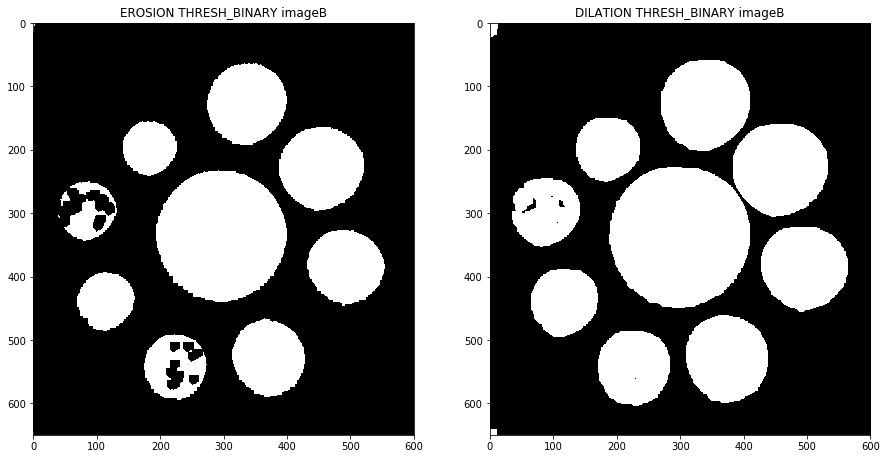

In [17]:
erodeimageblue_binary=cv2.erode(threshimageblue,elementkernel_b,iterations=itre_b)
dilateimageblue_binary=cv2.dilate(erodeimageblue_binary,elementkernel_b,iterations=itre_b)
plt.figure(figsize=(15,15));
plt.subplot(121);plt.title("EROSION THRESH_BINARY imageB");plt.imshow(erodeimageblue_binary);
plt.subplot(122);plt.title("DILATION THRESH_BINARY imageB");plt.imshow(dilateimageblue_binary);

#### DILATION FOLLOWED BY EROSION on THRESHOLDED image with BLUE Channel and BINARY INVERSE METHOD

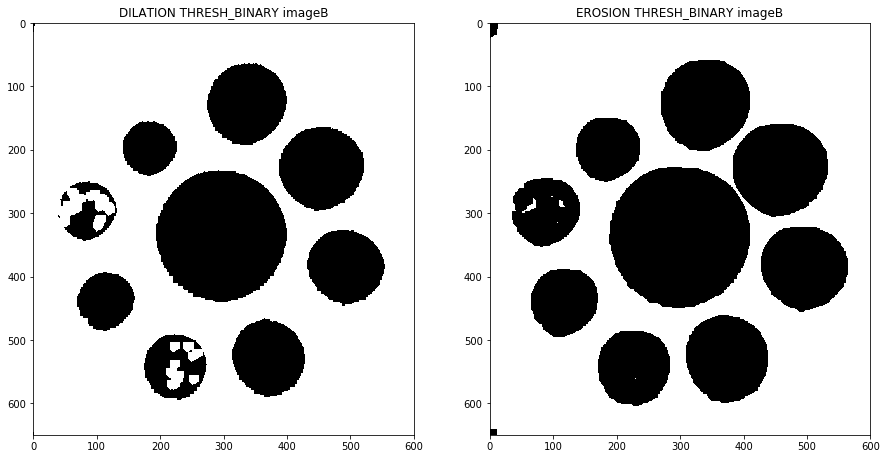

In [18]:
dilateimageblue_inv=cv2.dilate(threshimageblue_inv,elementkernel_b,iterations=itre_b)
erodeimageblue_inv=cv2.erode(dilateimageblue_inv,elementkernel_b,iterations=itre_b)
plt.figure(figsize=(15,15));
plt.subplot(121);plt.title("DILATION THRESH_BINARY imageB");plt.imshow(dilateimageblue_inv);
plt.subplot(122);plt.title("EROSION THRESH_BINARY imageB");plt.imshow(erodeimageblue_inv);

### ImageGray Morphological Operations

#### EROSION FOLLOWED BY DILATION on THRESHOLDED image with GRAYSCALE and BINARY METHOD

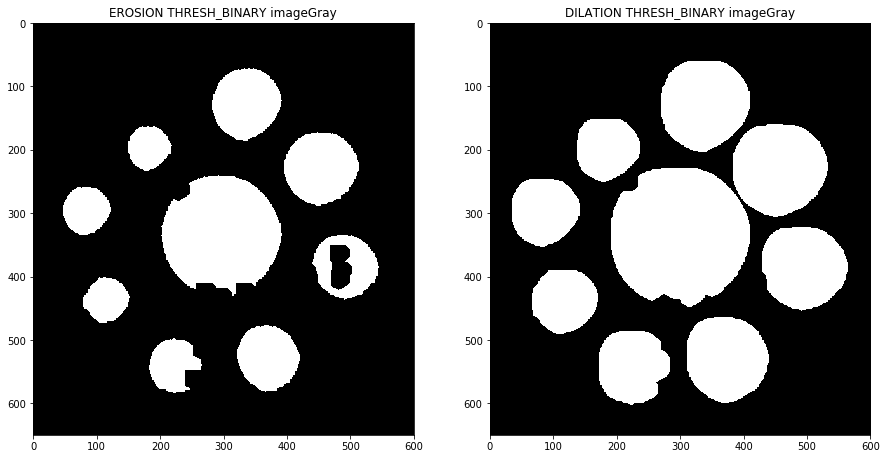

In [19]:
elementkernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(6,6))
itera=6
erodeimagegray_binary=cv2.erode(threshimagegray_binary,elementkernel,iterations=itera)
dilateimagegray_binary=cv2.dilate(erodeimagegray_binary,elementkernel,iterations=itera)
plt.figure(figsize=(15,15));
plt.subplot(121);plt.title("EROSION THRESH_BINARY imageGray");plt.imshow(erodeimagegray_binary);
plt.subplot(122);plt.title("DILATION THRESH_BINARY imageGray");plt.imshow(dilateimagegray_binary);

#### DILATION FOLLOWED BY EROSION on THRESHOLDED image with GRAYSCALE and BINARY INVERSE METHOD

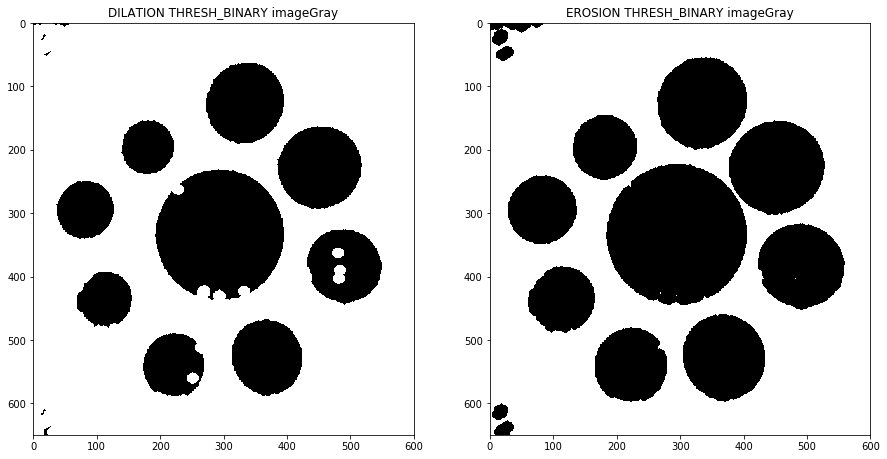

In [20]:
elementkernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(7,7))
itera=3
dilateimagegray_inv=cv2.dilate(threshimagegray_inv,elementkernel,iterations=itera)
erodeimagegray_inv=cv2.erode(dilateimagegray_inv,elementkernel,iterations=itera)
plt.figure(figsize=(15,15));
plt.subplot(121);plt.title("DILATION THRESH_BINARY imageGray");plt.imshow(dilateimagegray_inv);
plt.subplot(122);plt.title("EROSION THRESH_BINARY imageGray");plt.imshow(erodeimagegray_inv);

In [ ]:
'''
From the above observation we can use any of the erosion or dialation of imageG, imageB, imageGray for further detection
'''

## <font style = "color:rgb(50,120,229)">Step 4.1: Create SimpleBlobDetector</font>

In [21]:
# Set up the SimpleBlobdetector with default parameters.
params = cv2.SimpleBlobDetector_Params()

params.blobColor = 255 ## Detect WHITE BLOB
#params.blobColor = 0 ## Detect Black BLOB

params.minDistBetweenBlobs = 2

# Filter by Area.
params.filterByArea = False

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.8

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.8

# Filter by Inertia
params.filterByInertia =True
params.minInertiaRatio = 0.8

In [22]:
# Create SimpleBlobDetector
detector = cv2.SimpleBlobDetector_create(params)

## <font style = "color:rgb(50,120,229)">Step 4.2: Detect Coins</font>

### <font style = "color:rgb(8,133,37)">Hints</font>
Use **`detector.detect(image)`** to detect the blobs (coins). The output of the function is a list of **keypoints** where each keypoint is unique for each blob.

Print the number of coins detected as well.

[<KeyPoint 0x7f09d8736ed0>, <KeyPoint 0x7f09882dbb70>, <KeyPoint 0x7f09882dbf00>, <KeyPoint 0x7f09882db5a0>, <KeyPoint 0x7f09882dbe10>, <KeyPoint 0x7f09882db930>, <KeyPoint 0x7f09882db6f0>, <KeyPoint 0x7f09882dbb40>, <KeyPoint 0x7f0984032510>]


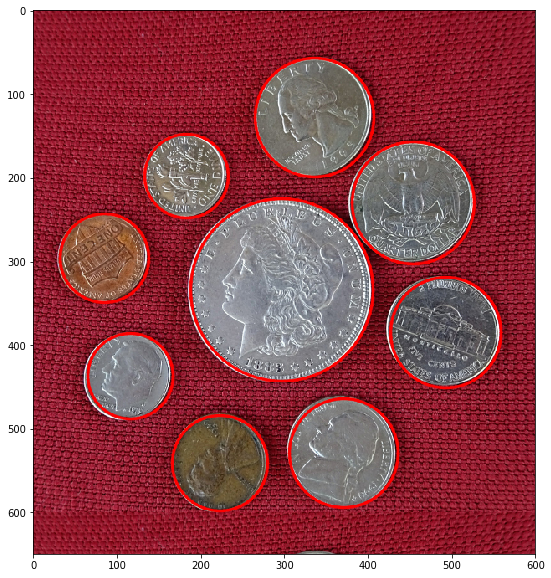

In [23]:
# Detect blobs
###
### YOUR CODE HERE
###
orimage=image.copy()
keypoints = detector.detect(dilateimagegray_binary)
print(keypoints)
for i in keypoints:
    x, y = i.pt
    x, y = np.int(x), np.int(y)
    cv2.circle(orimage,(x,y),int(i.size/2),(0,0,255),2,cv2.LINE_AA)
plt.imshow(orimage[:,:,::-1])

In [24]:
# Print number of coins detected
print("Number of coins detected = ",len(keypoints))

Number of coins detected =  9


**Note that we were able to detect all 9 coins. So, that's your benchmark.**

## <font style = "color:rgb(50,120,229)">Step 4.3: Display the detected coins on original image</font>

Make sure to mark the center of the blobs as well. **Use only the functions discussed in Image Annotation section in Week 1**

### <font style = "color:rgb(8,133,37)">Hints</font>
You can extract the coordinates of the center and the diameter of a blob using **`k.pt`** and **`k.size`** where `k` is a keypoint.

In [25]:
# Mark coins using image annotation concepts we have studied so far
###
### YOUR CODE HERE
###
orimage=image.copy()
keypoints = detector.detect(dilateimagegray_binary)
print(keypoints)
for i in keypoints:
    x, y = i.pt
    x, y = np.int(x), np.int(y)
    cv2.circle(orimage,(x,y),1,(0,0,255),2,cv2.LINE_AA)
    cv2.circle(orimage,(x,y),int(i.size/2),(0,0,255),2,cv2.LINE_AA)

[<KeyPoint 0x7f09db017d80>, <KeyPoint 0x7f09882dba80>, <KeyPoint 0x7f09882db9c0>, <KeyPoint 0x7f09840320f0>, <KeyPoint 0x7f0984032180>, <KeyPoint 0x7f0984032060>, <KeyPoint 0x7f0984032210>, <KeyPoint 0x7f09840323f0>, <KeyPoint 0x7f09840323c0>]


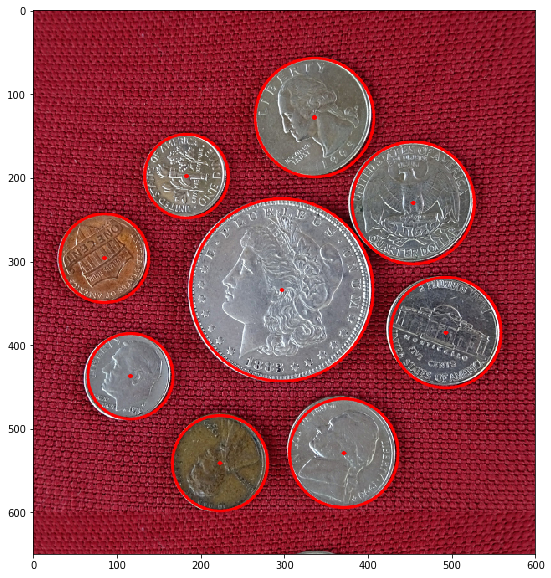

In [26]:
# Display the final image
###
### YOUR CODE HERE
###
plt.imshow(orimage[:,:,::-1])

## <font style = "color:rgb(50,120,229)">Step 4.4: Perform Connected Component Analysis</font>

In the final step, perform Connected Component Analysis (CCA) on the binary image to find out the number of connected components. Do you think we can use CCA to calculate number of coins? Why/why not?

In [27]:
def displayConnectedComponents(im):
    imLabels = im
    # The following line finds the min and max pixel values
    # and their locations in an image.
    (minVal, maxVal, minLoc, maxLoc) = cv2.minMaxLoc(imLabels)
    # Normalize the image so the min value is 0 and max value is 255.
    imLabels = 255 * (imLabels - minVal)/(maxVal-minVal)
    # Convert image to 8-bits unsigned type
    imLabels = np.uint8(imLabels)
    # Apply a color map
    imColorMap = cv2.applyColorMap(imLabels, cv2.COLORMAP_JET)
    # Display colormapped labels
    plt.imshow(imColorMap[:,:,::-1])

(10, array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int32))


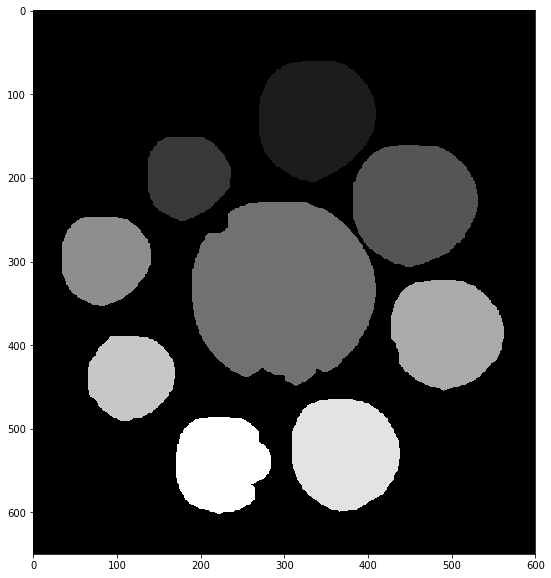

In [28]:
# Find connected components
###
### YOUR CODE HERE
###
test = cv2.connectedComponents(dilateimagegray_binary)
print(test)
plt.imshow(test[1])

In [29]:
print("Number of connected components detected = ",test[0])

Number of connected components detected =  10


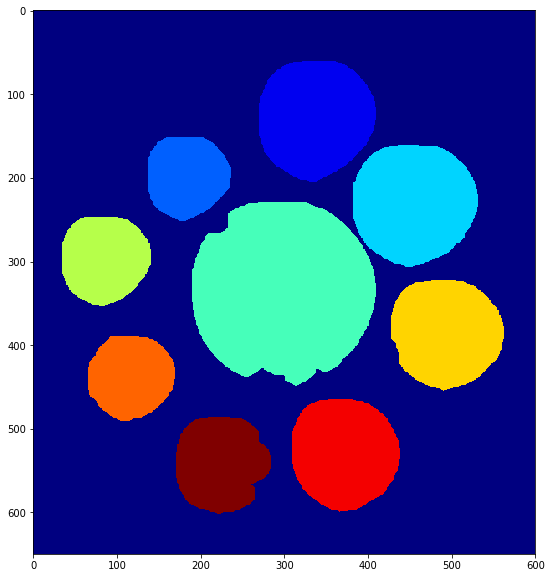

In [30]:
# Display connected components using displayConnectedComponents
# function
displayConnectedComponents(test[1])

## <font style = "color:rgb(50,120,229)">Step 4.5: Detect coins using Contour Detection</font>

In the final step, perform Contour Detection on the binary image to find out the number of coins.

In [31]:
# Find all contours in the image
###
### YOUR CODE HERE
###
contours, heirarchy = cv2.findContours(dilateimagegray_binary,cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)

In [32]:
# Print the number of contours found
###
### YOUR CODE HERE
###
print("Number of contours found = ",(len(heirarchy[0])))

Number of contours found =  9


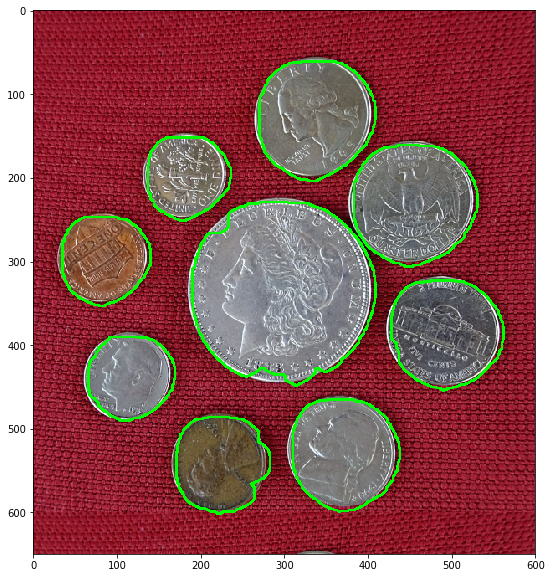

In [33]:
# Draw all contours
###
### YOUR CODE HERE
###
neworimage=image.copy()
contoursimage = cv2.drawContours(neworimage,contours,-1,(0,255,0),2)
plt.imshow(contoursimage[:,:,::-1])

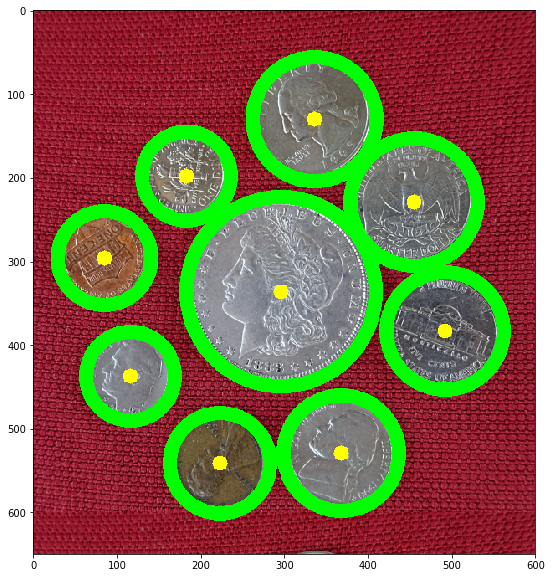

In [34]:
# Fit circles on coins
###
### YOUR CODE HERE
###
neworimagecopy=image.copy()
for i in contours:
    (x, y), radius = cv2.minEnclosingCircle(i)
    center = (int(x),int(y))
    radius = int(radius)
    cv2.circle(neworimagecopy,center,1,(0,255,255),cv2.LINE_AA,1)
    cv2.circle(neworimagecopy,center,radius,(0,255,0),cv2.LINE_AA,1)
plt.imshow(neworimagecopy[:,:,::-1])

# <font style = "color:rgb(50,120,229)">Assignment Part - B</font>

**Follow the same steps as provided in Assignment Part - A**

## <font style = "color:rgb(50,120,229)"> Step 1: Read Image</font>

Text(0.5,1,'Original Image')

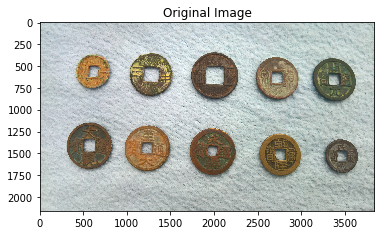

In [3]:
# Image path
imagePath ="CoinsB.jpg"
# Read image
# Store it in variable image
###
### YOUR CODE HERE
###
image = cv2.imread(imagePath)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")

## <font style = "color:rgb(50,120,229)">Step 2.1: Convert Image to Grayscale</font>

In [4]:
# Convert to grayscale
# Store in variable imageGray
###
### YOUR CODE HERE
###
imageGray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

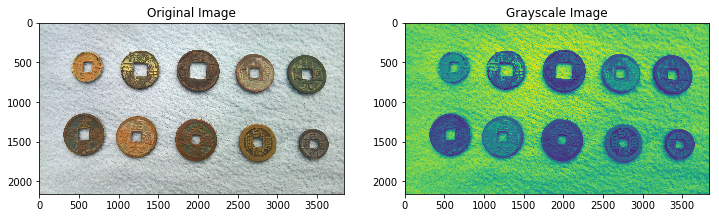

In [5]:
plt.figure(figsize=(12,12))
plt.subplot(121)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(122)
plt.imshow(imageGray);
plt.title("Grayscale Image");

## <font style = "color:rgb(50,120,229)">Step 2.2: Split Image into R,G,B Channels</font>

In [6]:
# Split cell into channels
# Variables are: imageB, imageG, imageR
###
### YOUR CODE HERE
###
imageB=image[:,:,0]
imageG=image[:,:,1]
imageR=image[:,:,2]

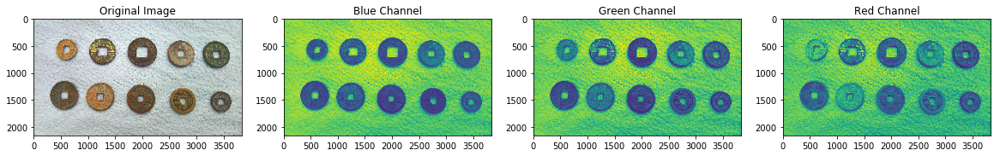

In [7]:
plt.figure(figsize=(20,12))
plt.subplot(141)
plt.imshow(image[:,:,::-1]);
plt.title("Original Image")
plt.subplot(142)
plt.imshow(imageB);
plt.title("Blue Channel")
plt.subplot(143)
plt.imshow(imageG);
plt.title("Green Channel")
plt.subplot(144)
plt.imshow(imageR);
plt.title("Red Channel");

## <font style = "color:rgb(50,120,229)">Step 3.1: Perform Thresholding</font>

You will have to carry out this step with different threshold values to see which one suits you the most. Do not remove those intermediate images and make sure to document your findings.

### Thresholding on ImageGrayScale

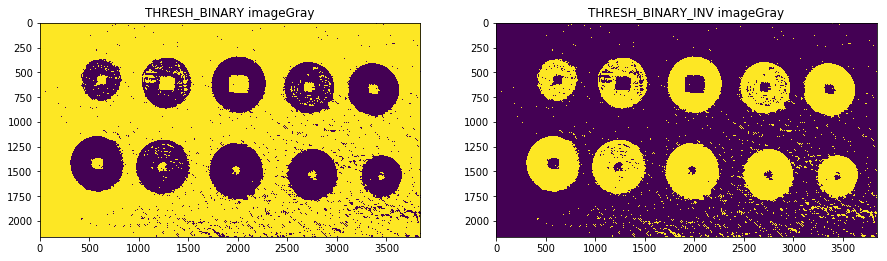

In [9]:

#Simplify it with this:

maxVal = 255

_, tImg_0 = cv2.threshold(imageB, 175, maxVal, cv2.THRESH_BINARY)
_, tImg_1 = cv2.threshold(imageB, 150, maxVal, cv2.THRESH_BINARY)
_, tImg_2 = cv2.threshold(imageB, 125, maxVal, cv2.THRESH_BINARY)
_, tImg_3 = cv2.threshold(imageB, 100, maxVal, cv2.THRESH_BINARY)

'''
imageB,imageG or imageR is your choice. You can experiment with this.
'''

_,threshimagegray_inv = cv2.threshold(imageGray,160,255,cv2.THRESH_BINARY_INV)
_,threshimagegray_binary = cv2.threshold(imageGray,160,255,cv2.THRESH_BINARY)
plt.figure(figsize=(15,15));
plt.subplot(121);plt.title("THRESH_BINARY imageGray");plt.imshow(threshimagegray_binary);
plt.subplot(122);plt.title("THRESH_BINARY_INV imageGray");plt.imshow(threshimagegray_inv);

### Thresholding on Image with Channel Blue

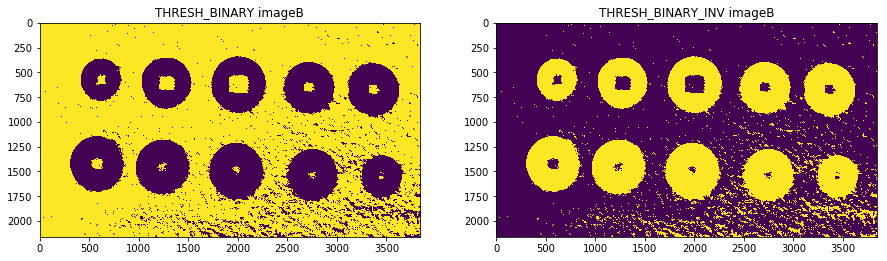

In [24]:
_,threshimageblue = cv2.threshold(imageB,170,255,cv2.THRESH_BINARY)
_,threshimageblue_inv = cv2.threshold(imageB,170,255,cv2.THRESH_BINARY_INV)
plt.figure(figsize=(15,15));
plt.subplot(121);plt.title("THRESH_BINARY imageB");plt.imshow(threshimageblue);
plt.subplot(122);plt.title("THRESH_BINARY_INV imageB");plt.imshow(threshimageblue_inv);

### Thresholding Image with Channel Green

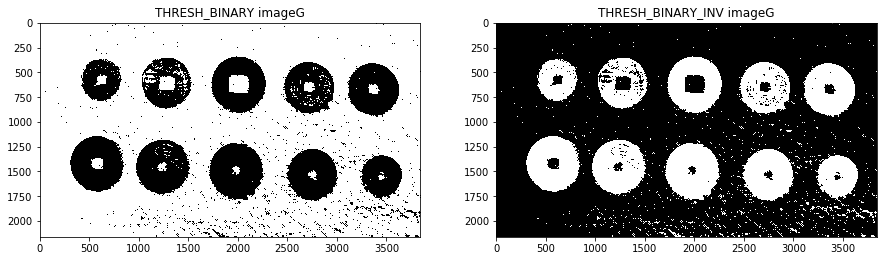

In [10]:
_,threshimagegreen_inv = cv2.threshold(imageG,162,255,cv2.THRESH_BINARY_INV)
_,threshimagegreen_binary = cv2.threshold(imageG,162,255,cv2.THRESH_BINARY)
plt.figure(figsize=(15,15));
plt.subplot(121);plt.title("THRESH_BINARY imageG");plt.imshow(threshimagegreen_binary);
plt.subplot(122);plt.title("THRESH_BINARY_INV imageG");plt.imshow(threshimagegreen_inv);

### Thresholding on Image with Channel Red

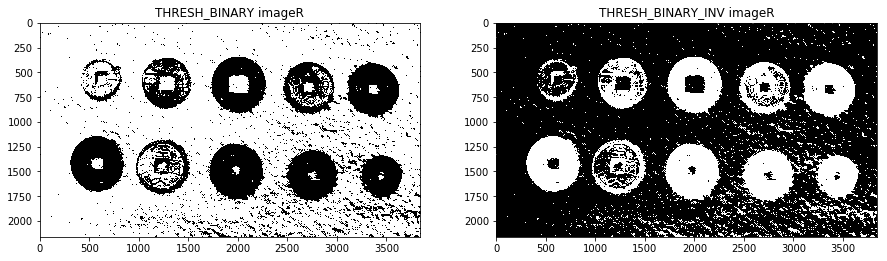

In [11]:
_,threshimagered = cv2.threshold(imageR,160,255,cv2.THRESH_BINARY)
_,threshimagered_inv = cv2.threshold(imageR,160,255,cv2.THRESH_BINARY_INV)
plt.figure(figsize=(15,15));
plt.subplot(121);plt.title("THRESH_BINARY imageR");plt.imshow(threshimagered);
plt.subplot(122);plt.title("THRESH_BINARY_INV imageR");plt.imshow(threshimagered_inv);

## <font style = "color:rgb(50,120,229)">Step 3.2: Perform morphological operations</font>

You will have to carry out this step with different kernel size, kernel shape and morphological operations to see which one (or more) suits you the most. Do not remove those intermediate images and make sure to document your findings.

### ImageGrayScale Morphological Operations

#### BINARY METHOD

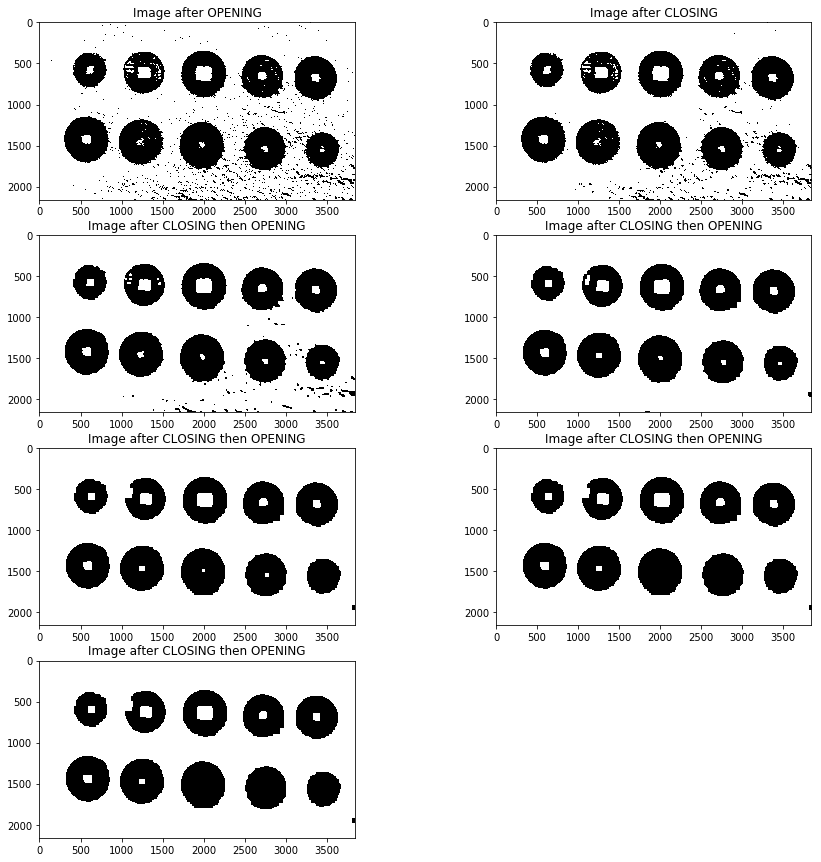

In [33]:
elementkernel_gray = cv2.getStructuringElement(cv2.MORPH_RECT,(3,3))
itera_gray=3
#OPENING
opening1_gray=cv2.morphologyEx(threshimagegray_binary,cv2.MORPH_OPEN,elementkernel_gray,iterations=itera_gray)

#CLOSING
closing1_gray=cv2.morphologyEx(opening1_gray,cv2.MORPH_CLOSE,elementkernel_gray,iterations=itera_gray)

elementkernel_gray = cv2.getStructuringElement(cv2.MORPH_RECT,(4,4))
itera_gray=4
##CLOSING
closing2_gray=cv2.morphologyEx(closing1_gray,cv2.MORPH_CLOSE,elementkernel_gray,iterations=itera_gray)
##OPENING
elementkernel_gray = cv2.getStructuringElement(cv2.MORPH_RECT,(5,5))
itera_gray=5
closingopening1_gray=cv2.morphologyEx(closing2_gray,cv2.MORPH_OPEN,elementkernel_gray,iterations=itera_gray)

elementkernel_gray = cv2.getStructuringElement(cv2.MORPH_RECT,(6,6))
itera_gray=6
#CLOSING
closing3_gray=cv2.morphologyEx(closingopening1_gray,cv2.MORPH_CLOSE,elementkernel_gray,iterations=itera_gray)
#OPENING
closingopening2_gray=cv2.morphologyEx(closing3_gray,cv2.MORPH_OPEN,elementkernel_gray,iterations=itera_gray)

elementkernel_gray = cv2.getStructuringElement(cv2.MORPH_RECT,(7,7))
itera_gray=7
#CLOSING
closing4_gray=cv2.morphologyEx(closingopening2_gray,cv2.MORPH_CLOSE,elementkernel_gray,iterations=itera_gray)
#OPENING
closingopening3_gray=cv2.morphologyEx(closing4_gray,cv2.MORPH_OPEN,elementkernel_gray,iterations=itera_gray)

elementkernel_gray = cv2.getStructuringElement(cv2.MORPH_RECT,(7,7))
itera_gray=8
#CLOSING
closing5_gray=cv2.morphologyEx(closingopening3_gray,cv2.MORPH_CLOSE,elementkernel_gray,iterations=itera_gray)
#OPENING
closingopening4_gray=cv2.morphologyEx(closing5_gray,cv2.MORPH_OPEN,elementkernel_gray,iterations=itera_gray)

elementkernel_gray = cv2.getStructuringElement(cv2.MORPH_RECT,(7,7))
itera_gray=9
#CLOSING
closing6_gray=cv2.morphologyEx(closingopening3_gray,cv2.MORPH_CLOSE,elementkernel_gray,iterations=itera_gray)
#OPENING
closingopening5_gray=cv2.morphologyEx(closing6_gray,cv2.MORPH_OPEN,elementkernel_gray,iterations=itera_gray)

# elementkernel_gray = cv2.getStructuringElement(cv2.MORPH_RECT,(7,7))
# itera_gray=8
# #CLOSING
# closing7_gray=cv2.morphologyEx(closingopening5_gray,cv2.MORPH_CLOSE,elementkernel_gray,iterations=itera_gray)
# #OPENING
# closingopening6_gray=cv2.morphologyEx(closing7_gray,cv2.MORPH_OPEN,elementkernel_gray,iterations=itera_gray)

plt.figure(figsize=(15,15));
plt.subplot(421);plt.title("Image after OPENING");plt.imshow(opening1_gray);
plt.subplot(422);plt.title("Image after CLOSING");plt.imshow(closing1_gray);
plt.subplot(423);plt.title("Image after CLOSING then OPENING");plt.imshow(closingopening1_gray);
plt.subplot(424);plt.title("Image after CLOSING then OPENING");plt.imshow(closingopening2_gray);
plt.subplot(425);plt.title("Image after CLOSING then OPENING");plt.imshow(closingopening3_gray);
plt.subplot(426);plt.title("Image after CLOSING then OPENING");plt.imshow(closingopening4_gray);
plt.subplot(427);plt.title("Image after CLOSING then OPENING");plt.imshow(closingopening5_gray);
# plt.subplot(428);plt.title("Image after CLOSING then OPENING");plt.imshow(closingopening6_gray);

#### BINARY INVERSE METHOD

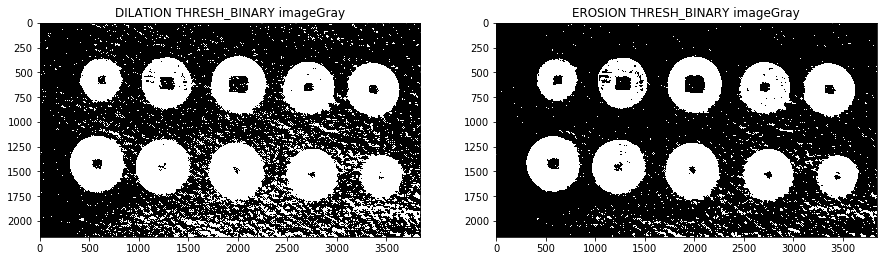

In [232]:
# elementkernel = cv2.getStructuringElement(cv2.MORPH_RECT,(3,3))
# itera=3

# dilateimagegray_inv=cv2.dilate(threshimagegray_inv,elementkernel,iterations=itera)
# erodeimagegray_inv=cv2.erode(dilateimagegray_inv,elementkernel,iterations=itera)
# plt.figure(figsize=(15,15));
# plt.subplot(121);plt.title("DILATION THRESH_BINARY imageGray");plt.imshow(dilateimagegray_inv);
# plt.subplot(122);plt.title("EROSION THRESH_BINARY imageGray");plt.imshow(erodeimagegray_inv);

### ImageB Morphological Operations

In [13]:
elementkernel_b = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))
itre_b = 3

#### BINARY METHOD

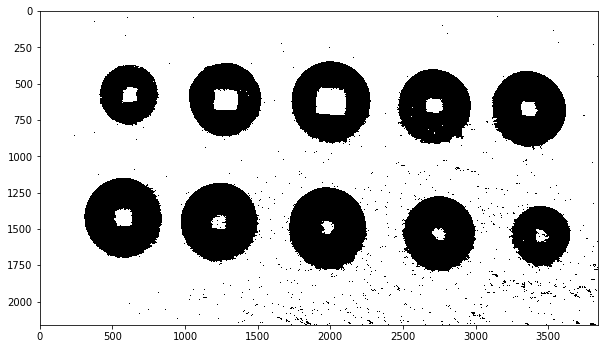

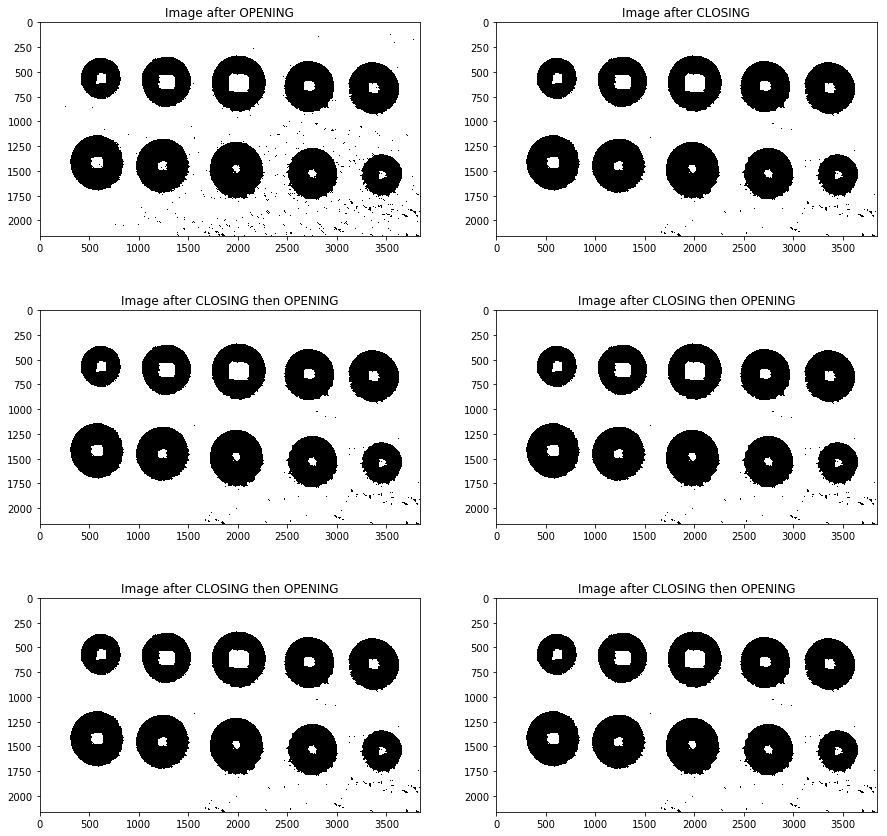

In [51]:
#OPENING
opening1_imageb=cv2.morphologyEx(threshimageblue,cv2.MORPH_OPEN,elementkernel_b,iterations=itre_b)

#CLOSING
closing1_imageb=-cv2.morphologyEx(opening1_imageb,cv2.MORPH_CLOSE,elementkernel_b,iterations=itre_b)

##CLOSING
closing2_imageb=cv2.morphologyEx(closing1_imageb,cv2.MORPH_CLOSE,elementkernel_b,iterations=itre_b)
##OPENING
closingopening1_imageb=cv2.morphologyEx(closing2_imageb,cv2.MORPH_OPEN,elementkernel_b,iterations=itre_b)

#CLOSING
closing3_imageb=cv2.morphologyEx(closingopening1_imageb,cv2.MORPH_CLOSE,elementkernel_b,iterations=itre_b)
#OPENING
closingopening2_imageb=cv2.morphologyEx(closing3_imageb,cv2.MORPH_OPEN,elementkernel_b,iterations=itre_b)

#CLOSING
closing4_imageb=cv2.morphologyEx(closingopening2_imageb,cv2.MORPH_CLOSE,elementkernel_b,iterations=itre_b)
#OPENING
closingopening3_imageb=cv2.morphologyEx(closing4_imageb,cv2.MORPH_OPEN,elementkernel_b,iterations=itre_b)

#CLOSING
closing5_imageb=cv2.morphologyEx(closingopening3_imageb,cv2.MORPH_CLOSE,elementkernel_b,iterations=itre_b)
#OPENING
closingopening4_imageb=cv2.morphologyEx(closing5_imageb,cv2.MORPH_OPEN,elementkernel_b,iterations=itre_b)
plt.imshow(threshimageblue);
plt.figure(figsize=(15,15));
plt.subplot(321);plt.title("Image after OPENING");plt.imshow(opening1_imageb);
plt.subplot(322);plt.title("Image after CLOSING");plt.imshow(closing1_imageb);
plt.subplot(323);plt.title("Image after CLOSING then OPENING");plt.imshow(closingopening1_imageb);
plt.subplot(324);plt.title("Image after CLOSING then OPENING");plt.imshow(closingopening2_imageb);
plt.subplot(325);plt.title("Image after CLOSING then OPENING");plt.imshow(closingopening3_imageb);
plt.subplot(326);plt.title("Image after CLOSING then OPENING");plt.imshow(closingopening4_imageb);

# #OPENING
# erodeimageblue_binary1=cv2.erode(threshimageblue,elementkernel_b,iterations=itre_b)
# dilateimageblue_binary1=cv2.dilate(erodeimageblue_binary1,elementkernel_b,iterations=itre_b)

# #CLOSING
# dilateimageblue_binary2=cv2.dilate(dilateimageblue_binary1,elementkernel_b,iterations=itre_b)
# erodeimageblue_binary2=cv2.erode(dilateimageblue_binary2,elementkernel_b,iterations=itre_b)

# #CLOSING
# dilateimageblue_binary3=cv2.dilate(erodeimageblue_binary2,elementkernel_b,iterations=itre_b)
# erodeimageblue_binary3=cv2.erode(dilateimageblue_binary3,elementkernel_b,iterations=itre_b)
# #OPENING
# erodeimageblue_binary4=cv2.erode(erodeimageblue_binary3,elementkernel_b,iterations=itre_b)
# dilateimageblue_binary4=cv2.dilate(erodeimageblue_binary4,elementkernel_b,iterations=itre_b)

# #CLOSING
# dilateimageblue_binary5=cv2.dilate(erodeimageblue_binary4,elementkernel_b,iterations=itre_b)
# erodeimageblue_binary5=cv2.erode(dilateimageblue_binary5,elementkernel_b,iterations=itre_b)
# #OPENING
# erodeimageblue_binary6=cv2.erode(erodeimageblue_binary4,elementkernel_b,iterations=itre_b)
# dilateimageblue_binary6=cv2.dilate(erodeimageblue_binary5,elementkernel_b,iterations=itre_b)

# #CLOSING
# dilateimageblue_binary7=cv2.dilate(dilateimageblue_binary5,elementkernel_b,iterations=itre_b)
# erodeimageblue_binary7=cv2.erode(dilateimageblue_binary6,elementkernel_b,iterations=itre_b)
# #OPENING
# erodeimageblue_binary8=cv2.erode(erodeimageblue_binary6,elementkernel_b,iterations=itre_b)
# dilateimageblue_binary8=cv2.dilate(erodeimageblue_binary7,elementkernel_b,iterations=itre_b)

# #CLOSING
# dilateimageblue_binary9=cv2.dilate(dilateimageblue_binary7,elementkernel_b,iterations=itre_b)
# erodeimageblue_binary9=cv2.erode(dilateimageblue_binary8,elementkernel_b,iterations=itre_b)
# #OPENING
# erodeimageblue_binary10=cv2.erode(erodeimageblue_binary8,elementkernel_b,iterations=itre_b)
# dilateimageblue_binary10=cv2.dilate(erodeimageblue_binary9,elementkernel_b,iterations=itre_b)

# plt.figure(figsize=(15,15));
# plt.subplot(221);plt.title("Image after OPENING");plt.imshow(dilateimageblue_binary1);
# plt.subplot(222);plt.title("Image after CLOSING");plt.imshow(erodeimageblue_binary2);
# plt.subplot(223);plt.title("Image after CLOSING then OPENING");plt.imshow(dilateimageblue_binary4);
# plt.subplot(224);plt.title("Image after CLOSING then OPENING");plt.imshow(dilateimageblue_binary5);
# plt.subplot(325);plt.title("Image after CLOSING then OPENING");plt.imshow(closingopening3);
# plt.subplot(326);plt.title("Image after CLOSING then OPENING");plt.imshow(closingopening4);

#### BINARY INVERSE METHOD

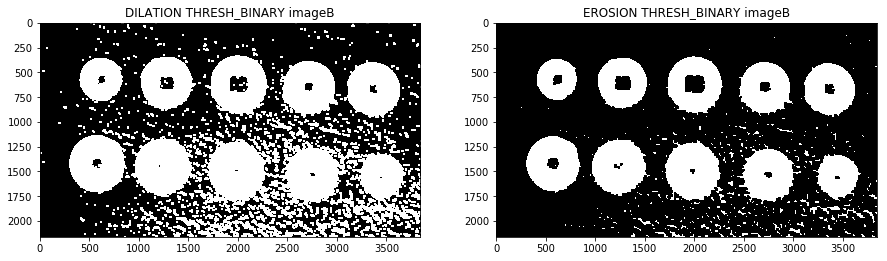

In [17]:
dilateimageblue_inv=cv2.dilate(threshimageblue_inv,elementkernel_b,iterations=itre_b)
erodeimageblue_inv=cv2.erode(dilateimageblue_inv,elementkernel_b,iterations=itre_b)
plt.figure(figsize=(15,15));
plt.subplot(121);plt.title("DILATION THRESH_BINARY imageB");plt.imshow(dilateimageblue_inv);
plt.subplot(122);plt.title("EROSION THRESH_BINARY imageB");plt.imshow(erodeimageblue_inv);

## WORKING PART BELOW

### ImageG Morphological Operations

#### BINARY METHOD

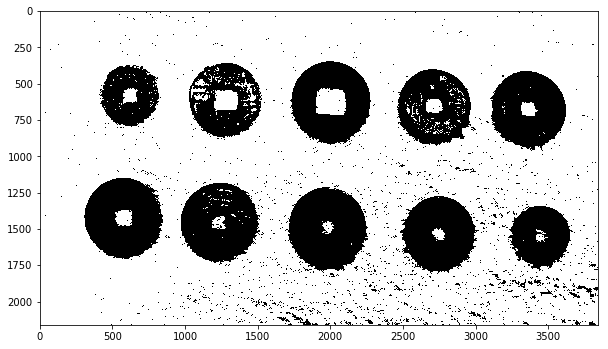

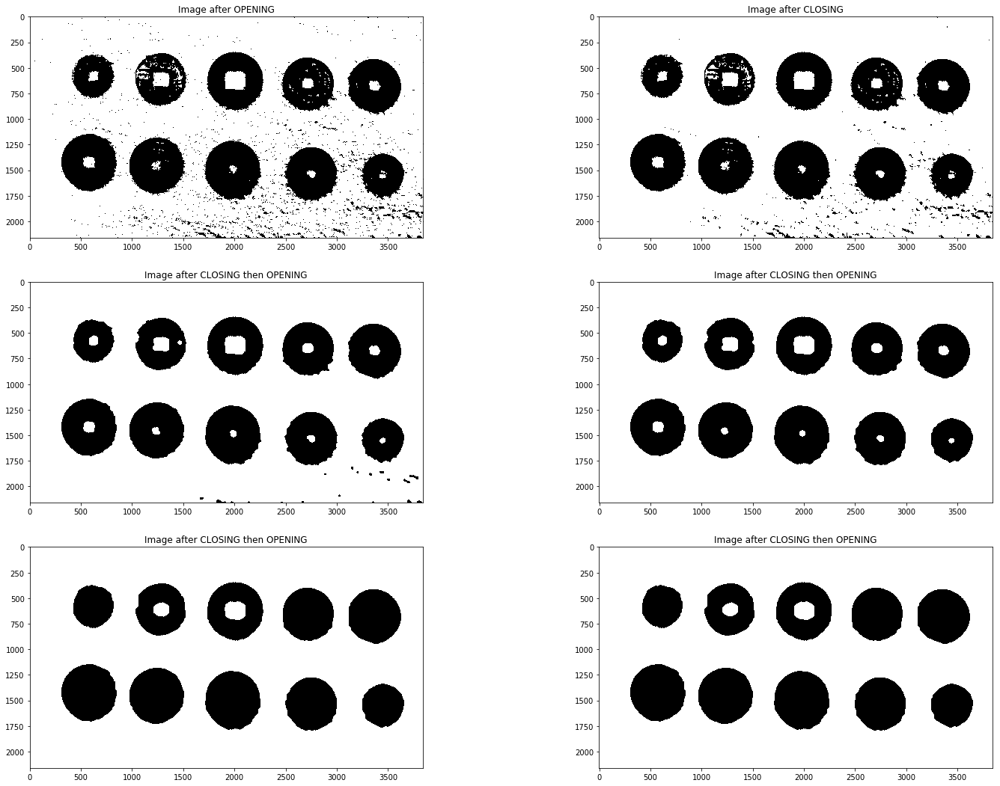

In [35]:
elementkernel_g = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))
num_iter=3
#OPENING
opening1=cv2.morphologyEx(threshimagegreen_binary,cv2.MORPH_OPEN,elementkernel_g,iterations=num_iter)

# elementkernel_g = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(4,4))
# num_iter=4
#CLOSING
closing1=-cv2.morphologyEx(opening1,cv2.MORPH_CLOSE,elementkernel_g,iterations=num_iter)

elementkernel_g = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5))
num_iter=5
# ##CLOSING
closing2=cv2.morphologyEx(closing1,cv2.MORPH_CLOSE,elementkernel_g,iterations=num_iter)
elementkernel_g = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(7,7))
num_iter=7
# ##OPENING
closingopening1=cv2.morphologyEx(closing2,cv2.MORPH_OPEN,elementkernel_g,iterations=num_iter)

elementkernel_g = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(7,7))
num_iter=9
#CLOSING
closing3=cv2.morphologyEx(closingopening1,cv2.MORPH_CLOSE,elementkernel_g,iterations=num_iter)
#OPENING
closingopening2=cv2.morphologyEx(closing3,cv2.MORPH_OPEN,elementkernel_g,iterations=num_iter)

elementkernel_g = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(7,7))
num_iter=18
#CLOSING
closing4=cv2.morphologyEx(closingopening2,cv2.MORPH_CLOSE,elementkernel_g,iterations=num_iter)
#OPENING
closingopening3=cv2.morphologyEx(closing4,cv2.MORPH_OPEN,elementkernel_g,iterations=num_iter)

elementkernel_g = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(7,7))
num_iter=21
#CLOSING
closing5=cv2.morphologyEx(closingopening3,cv2.MORPH_CLOSE,elementkernel_g,iterations=num_iter)
#OPENING
closingopening4=cv2.morphologyEx(closing5,cv2.MORPH_OPEN,elementkernel_g,iterations=num_iter)

# elementkernel_g = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(7,7))
# num_iter=22
# #CLOSING
# closing5=cv2.morphologyEx(closingopening4,cv2.MORPH_CLOSE,elementkernel_g,iterations=num_iter)
# #OPENING
# closingopening5=cv2.morphologyEx(closing5,cv2.MORPH_OPEN,elementkernel_g,iterations=num_iter)

plt.imshow(threshimagegreen_binary);
plt.figure(figsize=(25,25));
plt.subplot(421);plt.title("Image after OPENING");plt.imshow(opening1);
plt.subplot(422);plt.title("Image after CLOSING");plt.imshow(closing1);
plt.subplot(423);plt.title("Image after CLOSING then OPENING");plt.imshow(closingopening1);
plt.subplot(424);plt.title("Image after CLOSING then OPENING");plt.imshow(closingopening2);
plt.subplot(425);plt.title("Image after CLOSING then OPENING");plt.imshow(closingopening3);
plt.subplot(426);plt.title("Image after CLOSING then OPENING");plt.imshow(closingopening4);
# plt.subplot(427);plt.title("Image after CLOSING then OPENING");plt.imshow(closingopening5);

## WORKING PART ^^^ ABOVE

#### BINARY INVERSE METHOD

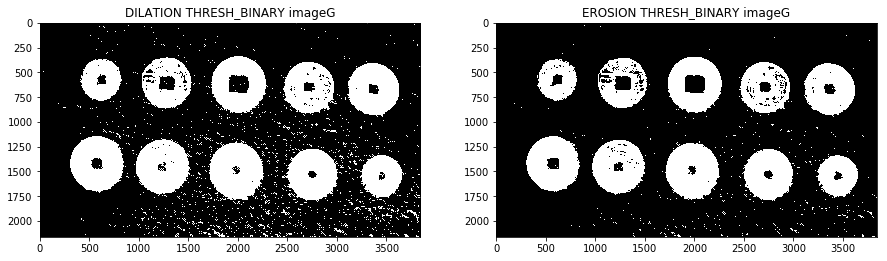

In [171]:
dilateimagegreen_inv=cv2.dilate(threshimagegreen_inv,elementkernel_g,iterations=num_iter)
erodeimagegreen_inv=cv2.erode(dilateimagegreen_inv,elementkernel_g,iterations=num_iter)
plt.figure(figsize=(15,15));
plt.subplot(121);plt.title("DILATION THRESH_BINARY imageG");plt.imshow(dilateimagegreen_inv);
plt.subplot(122);plt.title("EROSION THRESH_BINARY imageG");plt.imshow(erodeimagegreen_inv);

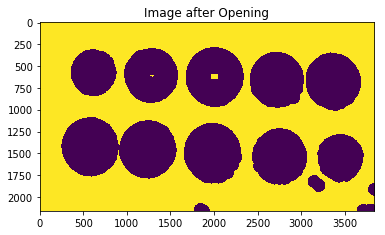

In [25]:

#You don't need to use such complicated binary method. Simplyfy it this way:
#Closing: 

cS1 = 6
cS2 = 10
e1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2 * cS1 + 1, 2 * cS1 + 1))
e2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2 * cS2 + 1, 2 * cS2 + 1))


tryClose_1 = cv2.morphologyEx(threshimageblue, cv2.MORPH_CLOSE, e1)
tryClose_2 = cv2.morphologyEx(threshimageblue, cv2.MORPH_CLOSE, e2)


#Opening: 

oS1 = 6
oS2 = 10
e1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2 * oS1 + 1, 2 * oS1 + 1))
e2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2 * oS2 + 1, 2 * oS2 + 1))


Opening_1 = cv2.morphologyEx(tryClose_2, cv2.MORPH_OPEN, e1)
Opening_2 = cv2.morphologyEx(tryClose_2, cv2.MORPH_OPEN, e2)


plt.imshow(Opening_1)
plt.title("Image after Opening")

temp_binary_image = Opening_1

kS = (11,11)
ker1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kS)
temp1 = cv2.dilate(temp_binary_image, ker1, iterations=3)
kS1 = 7
kS2 = 17
ker1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2 * kS1 + 1, 2 * kS1 + 1))
ker2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2 * kS2 + 1, 2 * kS2 + 1))

temp2 = cv2.erode(temp1,ker2, iterations=4)
#plt.imshow(temp2)
temp3 = cv2.dilate(temp2,ker2, iterations=4)
#plt.imshow(temp3)
temp4 = cv2.erode(temp3,ker2, iterations=4)
#plt.imshow(temp4)
temp5 = cv2.dilate(temp4, ker1, iterations=4)
#plt.imshow(temp5)
temp6 = cv2.erode(temp5, ker2, iterations=2)
plt.imshow(temp6)
binaryImg = temp6

#Use this binaryimg with detector and you'll get the results. I had tested this with your code and it's working.
#Your working code was quiet complicated and multiple operations resulted in wrong inputs.
#Only these Morphological operations are sufficient.


## <font style = "color:rgb(50,120,229)">Step 4.1: Create SimpleBlobDetector</font>

In [26]:
# Set up the SimpleBlobdetector with default parameters.
params = cv2.SimpleBlobDetector_Params()

params.blobColor = 0

params.minDistBetweenBlobs = 2

# Filter by Area.
params.filterByArea = False

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 2

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.8

# Filter by Inertia
params.filterByInertia =True
params.minInertiaRatio = 0.8

In [20]:
plt.imshow(closingopening4)

NameError: name 'closingopening4' is not defined

In [27]:
# Create SimpleBlobDetector
detector = cv2.SimpleBlobDetector_create(params)


## <font style = "color:rgb(50,120,229)">Step 4.2: Detect Coins</font>

### <font style = "color:rgb(8,133,37)">Hints</font>
Use **`detector.detect(image)`** to detect the blobs (coins). The output of the function is a list of **keypoints** where each keypoint is unique for each blob.

Print the number of coins detected as well.

In [28]:
# Detect blobs
###
### YOUR CODE HERE
###
detections = detector.detect(binaryImg)
print(detections)

[]


## <font style = "color:rgb(50,120,229)">Step 4.3: Display the detected coins on original image</font>

Make sure to mark the center of the blobs as well. **Use only the functions discussed in Image Annotation section in Week 1**

### <font style = "color:rgb(8,133,37)">Hints</font>
You can extract the coordinates of the center and the diameter of a blob using **`k.pt`** and **`k.size`** where `k` is a keypoint.

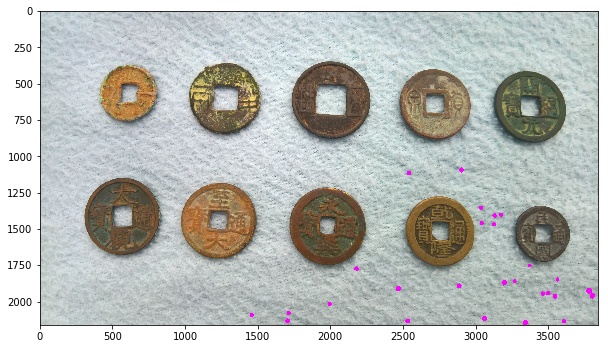

In [182]:
newori = image.copy()
for k in detections:
    (x,y) = k.pt
    x = int(x)
    y = int(y)
    radius = int(k.size/2)
    cv2.circle(newori,(x,y),radius,(255,0,255),cv2.LINE_AA,5)
plt.imshow(newori[:,:,::-1])

In [58]:
###
### YOUR CODE HERE
###


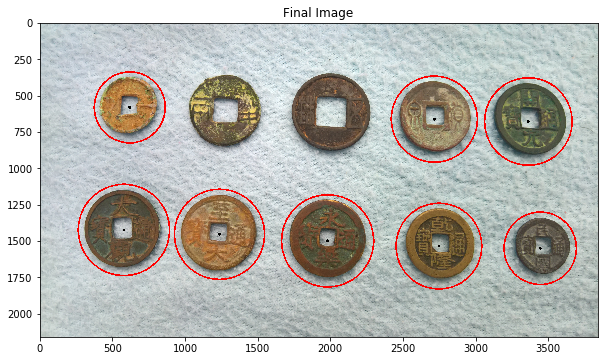

In [59]:
###
### YOUR CODE HERE
###


**Note that we were able to detect 8 coins. So, that's your benchmark.**

## <font style = "color:rgb(50,120,229)">Step 4.4: Perform Connected Component Analysis</font>

Now, let's perform Connected Component Analysis (CCA) on the binary image to find out the number of connected components. Do you think we can use CCA to calculate number of coins? Why/why not?

In [60]:
###
### YOUR CODE HERE
###


In [19]:
###
### YOUR CODE HERE
###
cca = cv2.connectedComponents(closingopening4)
print(cca)

(4, array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]], dtype=int32))


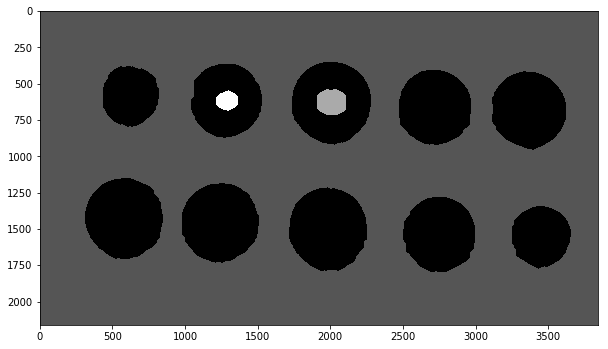

In [20]:
plt.imshow(cca[1])

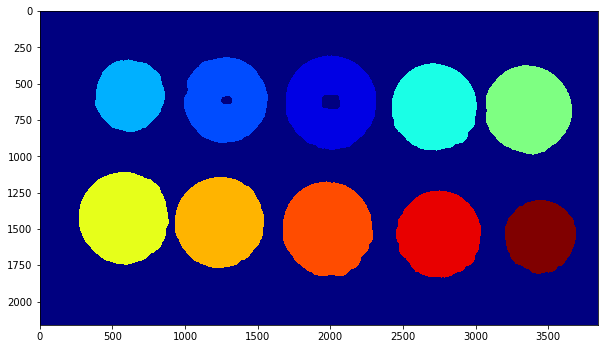

In [62]:
###
### YOUR CODE HERE
###


## <font style = "color:rgb(50,120,229)">Step 4.5: Detect coins using Contour Detection</font>

In the final step, perform Contour Detection on the binary image to find out the number of coins.

In [63]:
# Find all contours in the image
###
### YOUR CODE HERE
###


In [64]:
# Print the number of contours found
###
### YOUR CODE HERE
###


Number of contours found = 13


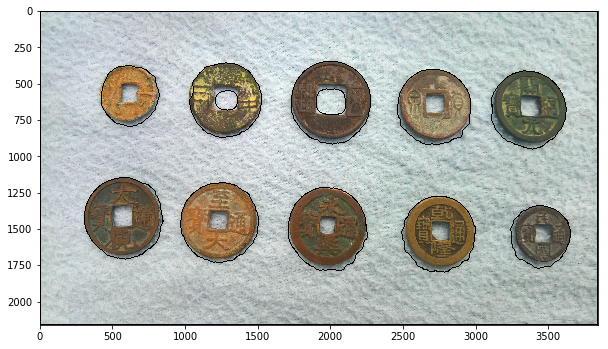

In [65]:
# Draw all contours
###
### YOUR CODE HERE
###


Number of contours found = 1


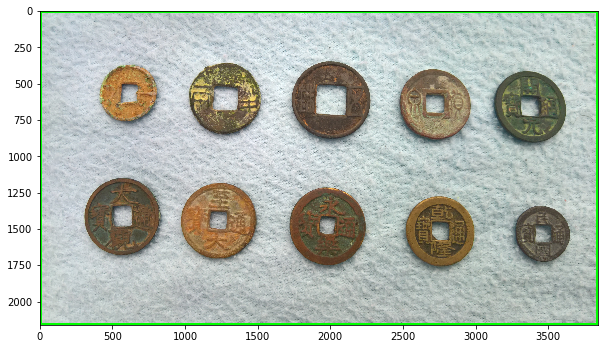

In [66]:
# Remove the inner contours
# Display the result
###
### YOUR CODE HERE
###


What do you think went wrong? As we can see, the outer box was detected as a contour and with respect to it, all other contours are internal and that's why they were not detected. How do we remove that? Let's see if we can use area of contours here.

In [67]:
# Print area and perimeter of all contours
###
### YOUR CODE HERE
###


Contour #1 has area = 135398.0 and perimeter = 1401.449918627739
Contour #2 has area = 203535.5 and perimeter = 1720.5697610378265
Contour #3 has area = 242100.5 and perimeter = 1871.0794281959534
Contour #4 has area = 229459.0 and perimeter = 1813.3809397220612
Contour #5 has area = 235121.5 and perimeter = 1837.1382957696915
Contour #6 has area = 16605.5 and perimeter = 485.2031031847
Contour #7 has area = 30872.0 and perimeter = 666.9015874862671
Contour #8 has area = 213446.5 and perimeter = 1743.339308977127
Contour #9 has area = 207230.0 and perimeter = 1723.2144236564636
Contour #10 has area = 130007.0 and perimeter = 1371.1067732572556
Contour #11 has area = 197785.0 and perimeter = 1696.1261086463928
Contour #12 has area = 243313.0 and perimeter = 1854.836783528328
Contour #13 has area = 8288401.0 and perimeter = 11996.0


In [68]:
# Print maximum area of contour
# This will be the box that we want to remove
###
### YOUR CODE HERE
###


Maximum area of contour = 8288401.0


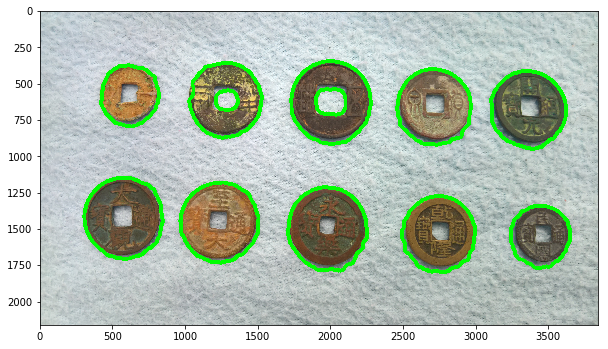

In [69]:
# Remove this contour and plot others
###
### YOUR CODE HERE
###


Now, we have to remove the internal contours. Again here we can use area or perimeter.

In [70]:
# Print sorted area of contours
###
### YOUR CODE HERE
###


16605.5
30872.0
130007.0
135398.0
197785.0
203535.5
207230.0
213446.5
229459.0
235121.5
242100.5
243313.0
8288401.0


We can clearly see the jump from 2nd area to 3rd. These are the 2 inner contours.

Number of contours = 10


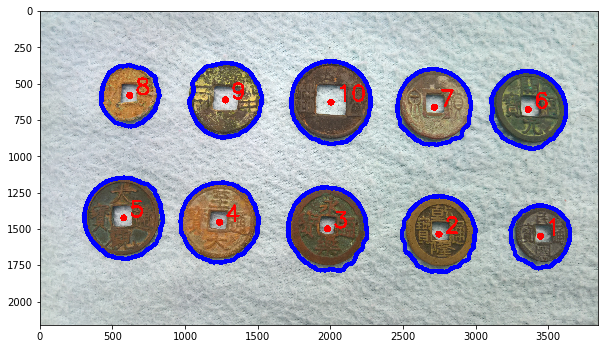

In [71]:
# Remove the 2 inner contours
# Plot the rest of them
###
### YOUR CODE HERE
###


Number of coins detected = 10


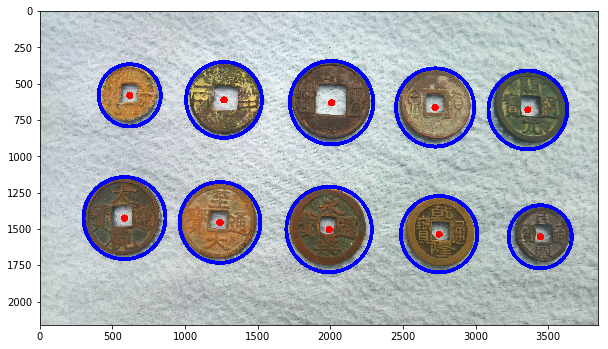

In [72]:
# Fit circles on coins
###
### YOUR CODE HERE
###
